
<center>
<hr>
<hr>
<font style="font-size:5.4em ; color:black'" > 
<span style="background : yellow">
#1 Introduction
</span>
</font>
<hr>
<hr>
</center>


In [52]:
from IPython.display import display,Latex,Math,HTML
import sympy as sym
import math
import matplotlib.pyplot as plt

# Example 1.1

### Problem Statement

*  A parachutist of mass 68.1 kg jumps out of a stationary hot air balloon. Use Eq. (1.10) to compute velocity prior to opening the chute. The drag coefficient is equal to 12.5 kg/s.

In [6]:
Latex(""" \\begin{equation*} \\Huge
      v(t) = {gm \\over c} (1-e^{-{c \\over m}t})
      \\end{equation*} 
      """)

<IPython.core.display.Latex object>

### Solution

In [7]:
t = sym.symbols('t')
m = 68.1
c = 12.5
g = 9.8

def vel(t):
    return g*m/c*(1-sym.exp(-c/m*t))

v = g*m/c*(1-exp(-c/m*t))

In [40]:
xdata = []
ydata = []
for i in range(0,26,2):
    print(f'v({i}) = {vel(i) if vel(i)!=0 else 0.0:0.5}')
    xdata.append(i)
    ydata.append(vel(i))
print(f'v({10000}) = {vel(10000):0.5}')

v(0) = 0.0
v(2) = 16.405
v(4) = 27.769
v(6) = 35.642
v(8) = 41.095
v(10) = 44.873
v(12) = 47.490
v(14) = 49.303
v(16) = 50.559
v(18) = 51.429
v(20) = 52.032
v(22) = 52.449
v(24) = 52.738
v(10000) = 53.390


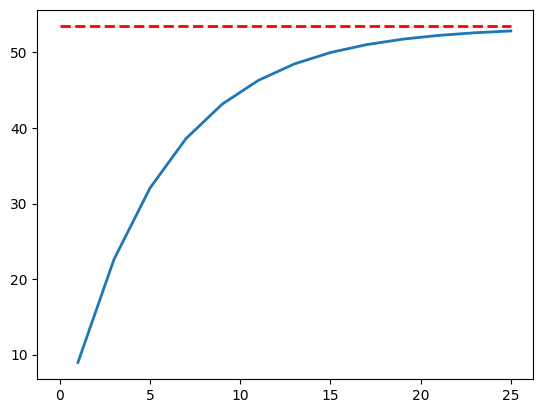

In [29]:
# Set up a new Figure, with equal aspect ratio so the ball appears round.
fig, ax = plt.subplots()
line, = ax.plot(xdata, ydata, lw=2)
ax.plot([0,25],[53.44,53.44],color='red',lw=2,ls='--')       

## Example 1.2

### Problem Statement

* Perform the same computation as in Example 1.1 but use Eq. (1.12)
to compute the velocity. 
* Employ a step size of 2 s for the calculation.

### Solution

In [38]:
m = 68.1
c = 12.5
g = 9.8

def dvel_i(v):
    global m,c,g
    return g - c/m*v[-1]

In [39]:
ti = [0]
vi = [0]
for i in range(2,21,2):
    ti.append(i)
    vv = vi[-1] + dvel_i(vi)*2
    vi.append(vv)
    print(f'v({i}) = {vv:0.5}')

v(2) = 19.6
v(4) = 32.005
v(6) = 39.856
v(8) = 44.824
v(10) = 47.969
v(12) = 49.959
v(14) = 51.219
v(16) = 52.016
v(18) = 52.521
v(20) = 52.84


In [47]:
def dy(t, y, m, cd):
    g = 9.8 
    return g - cd/m * y

def Euler(dt, ti, tf, yi, m, cd):
    t = ti 
    y = yi 
    h = dt 
    while t < tf: 
        if t + dt > tf: 
            h = tf - t  
        dydt = dy(t, y, m, cd) 
        y = y + dydt * h 
        t = t + h
    return y 


In [48]:
dt = 2
ti = 0
tf = 20
yi = 0
m = 68.1
cd = 12.5
print(Euler(dt, ti, tf, yi, m, cd))

52.83989057707389


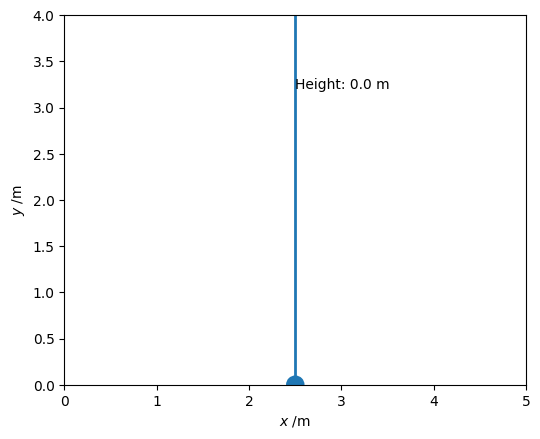

In [4]:
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# Acceleration due to gravity, m.s-2.
g = 9.81
# The maximum x-range of ball's trajectory to plot.
XMAX = 5
# The coefficient of restitution for bounces (-v_up/v_down).
cor = 0.65
# The time step for the animation.
dt = 0.005

# Initial position and velocity vectors.
x0, y0 = 0, 4
vx0, vy0 = 1, 0

def get_pos(t=0):
    """A generator yielding the ball's position at time t."""
    x, y, vx, vy = x0, y0, vx0, vy0
    while x < XMAX:
        t += dt
        x += vx0 * dt
        y += vy * dt
        vy -= g * dt
        if y < 0:
            # bounce!
            y = 0
            vy = -vy * cor 
        yield 2.5, y

def init():
    """Initialize the animation figure."""
    ax.set_xlim(0, XMAX)
    ax.set_ylim(0, y0)
    ax.set_xlabel('$x$ /m')
    ax.set_ylabel('$y$ /m')
    line.set_data(xdata, ydata)
    ball.set_center((x0, y0))
    height_text.set_text(f'Height: {y0:.1f} m')
    return line, ball, height_text

def animate(pos):
    """For each frame, advance the animation to the new position, pos."""
    x, y = pos
    xdata.append(x)
    ydata.append(y)
    line.set_data(xdata, ydata)
    ball.set_center((x, y))
    height_text.set_text(f'Height: {y:.1f} m')
    return line, ball, height_text

# Set up a new Figure, with equal aspect ratio so the ball appears round.
fig, ax = plt.subplots()
ax.set_aspect('equal')

# These are the objects we need to keep track of.
line, = ax.plot([], [], lw=2)
ball = plt.Circle((x0, y0), 0.10)
height_text = ax.text(XMAX*0.5, y0*0.8, f'Height: {y0:.1f} m')
ax.add_patch(ball)
xdata, ydata = [], []

interval = 1000*dt
ani = animation.FuncAnimation(fig, animate, get_pos, blit=True,interval=interval, repeat=False, init_func=init,cache_frame_data=False)
HTML(ani.to_jshtml())

# plt.show()

## Example 3.1

### Program Statement

* Suppose that you have the task of measuring the lengths of a bridge and a rivet and come up with 9999 and 9 cm, respectively.
* If the true values are 10,000 and 10 cm, respectively, compute (a) the true error and (b) the true percent rela- tive error for each case.

### Solution

In [46]:
Et = 10000 - 9999 
print(f'Et = {Et}')

Et = 10-9
print(f'Et = {Et}')

et = (10000-9999)/10000*100
print(f'et = {et}%')

et = (10-9)/10*100
print(f'et = {et}%')  

Et = 1
Et = 1
et = 0.01%
et = 10.0%


## Example 3.2 Error estimation 

### Program Statement

* In mathematics, functions can often be represented by infinite series. For example, the exponential function can be computed using

In [50]:
Latex(""" \\begin{equation*} \\Huge
      e^x = 1 + x + {x^2 \\over 2!} + {x^3 \\over 3!} + {x^4 \\over 4!} + \\cdots + {x^n \\over n!} + \\cdots
      \\end{equation*} 
      """)

<IPython.core.display.Latex object>

* Thus, as more terms are added in sequence, the approximation becomes a better and better estimate of the true value of ex. Equation (E3.2.1) is called a Maclaurin series expansion.
* Starting with the simplest version, ex 5 1, add terms one at a time to estimate e0.5. After each new term is added, compute the true and approximate percent relative errors with Eqs. (3.3) and (3.5), respectively. 
* Note that the true value is e^0.5 = 1.648721 . . . . Add terms until the absolute value of the approximate error estimate ea falls below a prespecified error criterion es conforming to three significant figures.

### Solution

In [66]:
def e_x(x,n):
    ex = 1
    for i in range(1,n+1):
        ex += x**i/sym.factorial(i)
    return ex

for i in range(0,11):
    et = (math.exp(0.5)-e_x(0.5,i))/math.exp(0.5)*100
    ea = (e_x(0.5,i)-e_x(0.5,i-1))/e_x(0.5,i)*100 if i>0 else 0
    print(f'{i}: e_x(x,{i}) = {float(e_x(0.5,i)):0.5}, et = {float(et):0.3}%, ea = {float(ea):0.3}%')


0: e_x(x,0) = 1.0, et = 39.3%, ea = 0.0%
1: e_x(x,1) = 1.5, et = 9.02%, ea = 33.3%
2: e_x(x,2) = 1.625, et = 1.44%, ea = 7.69%
3: e_x(x,3) = 1.6458, et = 0.175%, ea = 1.27%
4: e_x(x,4) = 1.6484, et = 0.0172%, ea = 0.158%
5: e_x(x,5) = 1.6487, et = 0.00142%, ea = 0.0158%
6: e_x(x,6) = 1.6487, et = 0.0001%, ea = 0.00132%
7: e_x(x,7) = 1.6487, et = 6.22e-06%, ea = 9.4e-05%
8: e_x(x,8) = 1.6487, et = 3.44e-07%, ea = 5.88e-06%
9: e_x(x,9) = 1.6487, et = 1.71e-08%, ea = 3.26e-07%
10: e_x(x,10) = 1.6487, et = 7.74e-10%, ea = 1.63e-08%


## Example 3.3 Computer Implementation of an Iterative Calculation

### Problem Statement :

* Develop a computer program based on the pseudocode from Fig. 3.3 to implement the calculation from Example 3.2.

### Solution

``` Python
def e_x(x,es,n,out=False):
    ex = 1
    sol = ex
    for i in range(1,n+1):
        sold = sol
        ex += x**i/sym.factorial(i)
        sol = ex
        ea = (sol-sold)/sol*100
        if abs(ea) < es:
            if out: print(f'   stoped at n = {i}, ea = {ea:0.5}%')
            break
    return ex
``` 

In [85]:
def e_x(x,es,n,out=False):
    ex = 1
    sol = ex
    for i in range(1,n+1):
        sold = sol
        ex += x**i/sym.factorial(i)
        sol = ex
        ea = (sol-sold)/sol*100
        if abs(ea) < es:
            if out: print(f'   stoped at n = {i}, ea = {ea:0.5}%')
            break
    return ex

In [89]:
es = 1e-6
for i in range(20):
    print(f'{i}: e_x(x,{es},{i}) = {float(e_x(0.5,es,i,True)):0.5}')

0: e_x(x,1e-06,0) = 1.0
1: e_x(x,1e-06,1) = 1.5
2: e_x(x,1e-06,2) = 1.625
3: e_x(x,1e-06,3) = 1.6458
4: e_x(x,1e-06,4) = 1.6484
5: e_x(x,1e-06,5) = 1.6487
6: e_x(x,1e-06,6) = 1.6487
7: e_x(x,1e-06,7) = 1.6487
8: e_x(x,1e-06,8) = 1.6487
   stoped at n = 9, ea = 3.2645E-7%
9: e_x(x,1e-06,9) = 1.6487
   stoped at n = 9, ea = 3.2645E-7%
10: e_x(x,1e-06,10) = 1.6487
   stoped at n = 9, ea = 3.2645E-7%
11: e_x(x,1e-06,11) = 1.6487
   stoped at n = 9, ea = 3.2645E-7%
12: e_x(x,1e-06,12) = 1.6487
   stoped at n = 9, ea = 3.2645E-7%
13: e_x(x,1e-06,13) = 1.6487
   stoped at n = 9, ea = 3.2645E-7%
14: e_x(x,1e-06,14) = 1.6487
   stoped at n = 9, ea = 3.2645E-7%
15: e_x(x,1e-06,15) = 1.6487
   stoped at n = 9, ea = 3.2645E-7%
16: e_x(x,1e-06,16) = 1.6487
   stoped at n = 9, ea = 3.2645E-7%
17: e_x(x,1e-06,17) = 1.6487
   stoped at n = 9, ea = 3.2645E-7%
18: e_x(x,1e-06,18) = 1.6487
   stoped at n = 9, ea = 3.2645E-7%
19: e_x(x,1e-06,19) = 1.6487


In [86]:
for i in range(0,11):
    et = (math.exp(0.5)-e_x(0.5,0.05,i))/math.exp(0.5)*100
    ea = (e_x(0.5,0.05,i)-e_x(0.5,0.05,i-1))/e_x(0.5,0.05,i)*100 if i>0 else 0
    print(f'{i}: e_x(x,{i}) = {float(e_x(0.5,0.05,i)):0.5}, et = {float(et):0.3}%, ea = {float(ea):0.3}%')

0: e_x(x,0) = 1.0, et = 39.3%, ea = 0.0%
1: e_x(x,1) = 1.5, et = 9.02%, ea = 33.3%
2: e_x(x,2) = 1.625, et = 1.44%, ea = 7.69%
3: e_x(x,3) = 1.6458, et = 0.175%, ea = 1.27%
4: e_x(x,4) = 1.6484, et = 0.0172%, ea = 0.158%
5: e_x(x,5) = 1.6487, et = 0.00142%, ea = 0.0158%
6: e_x(x,6) = 1.6487, et = 0.00142%, ea = 0.0%
7: e_x(x,7) = 1.6487, et = 0.00142%, ea = 0.0%
8: e_x(x,8) = 1.6487, et = 0.00142%, ea = 0.0%
9: e_x(x,9) = 1.6487, et = 0.00142%, ea = 0.0%
10: e_x(x,10) = 1.6487, et = 0.00142%, ea = 0.0%


## Example 3.4 Range of Integers

### Problem Statement :

* Determine the range of integers in base-10 that can be represented on a 16-bit computer.

### Solution

In [98]:
digit = [1 for i in range(0,15)]
print(f'digit = {digit}')

strdigit = ["{}x2^{}".format(d,i) for i,d in enumerate(digit)]
strdigit = list(reversed(strdigit))
strdigit = " + ".join(strdigit)
sumdigit = sum([d*2**i for i,d in enumerate(digit)]) 
print(f'{strdigit} = {sumdigit}')

digit = [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
1x2^14 + 1x2^13 + 1x2^12 + 1x2^11 + 1x2^10 + 1x2^9 + 1x2^8 + 1x2^7 + 1x2^6 + 1x2^5 + 1x2^4 + 1x2^3 + 1x2^2 + 1x2^1 + 1x2^0 = 32767


## Example 3.5 Hypothetical Set of Floating-Point Numbers

### Problem Statement:

* Create a hypothetical floating-point number set for a machine that stores information using 7-bit words. Employ the first bit for the sign of the number, the next three for the sign and the magnitude of the exponent, and the last three for the magnitude of the mantissa (Fig. 3.8).

[<img src="ex35_img.png" width=600/>](ex35_img.png)


### Solution

In [115]:
for i in range(0,2):
    I = [i]
    for j in range(0,2):
        J = [j]
        for k in range(2**2):
            K = [k//2,k%2]
            for l in range(2**3):
                T = I + J + K + [l//4,l//2%2,l%2]
                if T[0] == 0 and T[1] == 1 and T[2] == 1 and T[3]==1: 
                    mantissa = sum([T[i+4]*2**(-(i+1)) for i in range(3)])
                    print(T, mantissa, mantissa*2**(-3))

[0, 1, 1, 1, 0, 0, 0] 0.0 0.0
[0, 1, 1, 1, 0, 0, 1] 0.125 0.015625
[0, 1, 1, 1, 0, 1, 0] 0.25 0.03125
[0, 1, 1, 1, 0, 1, 1] 0.375 0.046875
[0, 1, 1, 1, 1, 0, 0] 0.5 0.0625
[0, 1, 1, 1, 1, 0, 1] 0.625 0.078125
[0, 1, 1, 1, 1, 1, 0] 0.75 0.09375
[0, 1, 1, 1, 1, 1, 1] 0.875 0.109375


<center>
<hr>
<font size="20" color='Blue' >The end...</font>
<hr>
</center>